In [ ]:
import cv2
import math
import numpy as np
from numpy.fft import fft2, ifft2, fftshift, ifftshift
import matplotlib.pyplot as plt
from scipy import misc
from scipy import ndimage
from skimage import filters

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


(224, 190, 3)


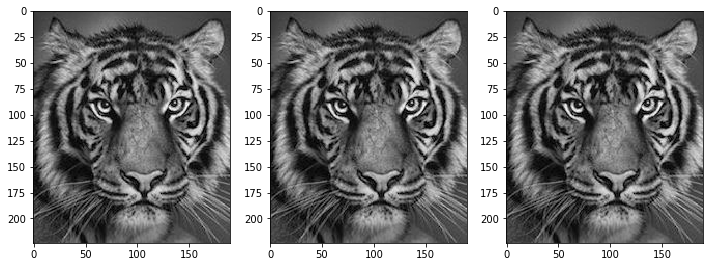

In [ ]:
image1 = "./tiger4.jpg"
img1 = np.float32(cv2.imread(image1))/255
print(img1.shape)


import matplotlib
%matplotlib inline
fig, axes = plt.subplots(1,3, figsize=(12, 12))

axes[0].imshow(img1[:,:,0],cmap='gray',interpolation='None')
axes[1].imshow(img1[:,:,1],cmap='gray',interpolation='None')
axes[2].imshow(img1[:,:,2],cmap='gray',interpolation='None')

(224, 190, 3)


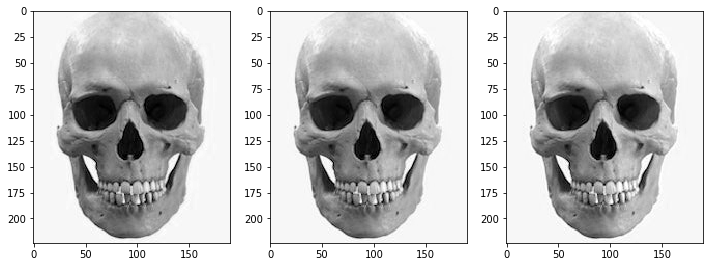

In [ ]:
image2 = "./skull1.jpeg"
img2 = np.float32(cv2.imread(image2))/255
print(img2.shape)


import matplotlib
%matplotlib inline
fig, axes = plt.subplots(1,3, figsize=(12, 12))

axes[0].imshow(img2[:,:,0],cmap='gray',interpolation='None')
axes[1].imshow(img2[:,:,1],cmap='gray',interpolation='None')
axes[2].imshow(img2[:,:,2],cmap='gray',interpolation='None')

(739, 500, 3)


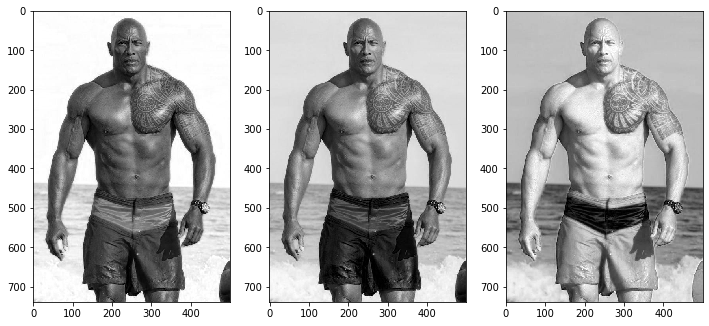

In [ ]:
image3 = "./body2.jpeg"
img3 = np.float32(cv2.imread(image3))/255
print(img3.shape)


import matplotlib
%matplotlib inline
fig, axes = plt.subplots(1,3, figsize=(12, 12))

axes[0].imshow(img3[:,:,0],cmap='gray',interpolation='None')
axes[1].imshow(img3[:,:,1],cmap='gray',interpolation='None')
axes[2].imshow(img3[:,:,2],cmap='gray',interpolation='None')

(739, 500, 3)


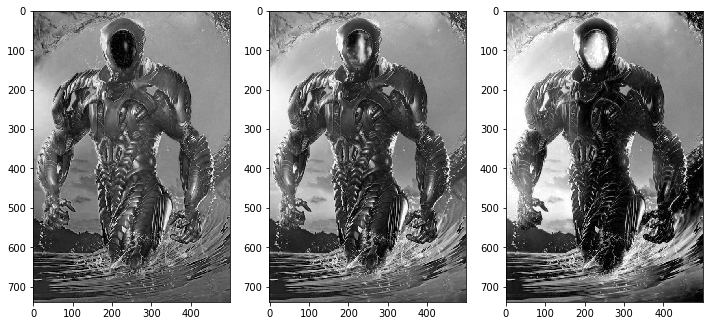

In [ ]:
image4 = "./lostinspace2.jpeg"
img4 = np.float32(cv2.imread(image4))/255
print(img4.shape)


import matplotlib
%matplotlib inline
fig, axes = plt.subplots(1,3, figsize=(12, 12))

axes[0].imshow(img4[:,:,0],cmap='gray',interpolation='None')
axes[1].imshow(img4[:,:,1],cmap='gray',interpolation='None')
axes[2].imshow(img4[:,:,2],cmap='gray',interpolation='None')

(448, 400, 3)


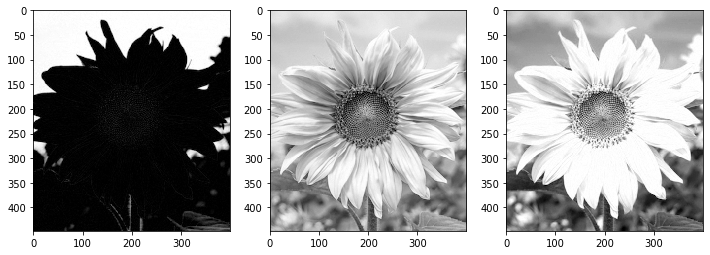

In [ ]:
image5 = "./sunflower1.jpeg"
img5 = np.float32(cv2.imread(image5))/255
print(img5.shape)


import matplotlib
%matplotlib inline
fig, axes = plt.subplots(1,3, figsize=(12, 12))

axes[0].imshow(img5[:,:,0],cmap='gray',interpolation='None')
axes[1].imshow(img5[:,:,1],cmap='gray',interpolation='None')
axes[2].imshow(img5[:,:,2],cmap='gray',interpolation='None')

(448, 400, 3)


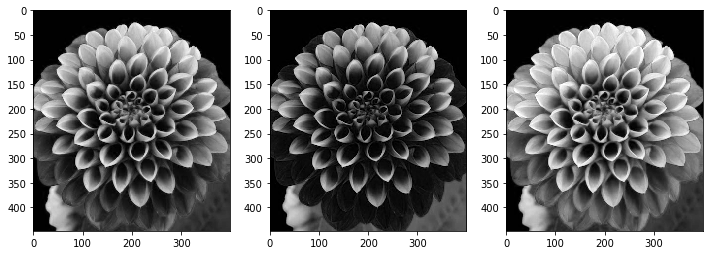

In [ ]:
image6 = "./flower5.jpeg"
img6 = np.float32(cv2.imread(image6))/255
print(img6.shape)


import matplotlib
%matplotlib inline
fig, axes = plt.subplots(1,3, figsize=(12, 12))

axes[0].imshow(img6[:,:,0],cmap='gray',interpolation='None')
axes[1].imshow(img6[:,:,1],cmap='gray',interpolation='None')
axes[2].imshow(img6[:,:,2],cmap='gray',interpolation='None')

In [ ]:
def gaussian_expression(x, y, sd, lowpass):
  gauss = math.exp(-1.0 * (x**2 + y**2) / (2 * sd**2))
  if not(lowpass):
    return 1 - gauss
  return gauss

def gaussian_filter(standard_deviation, row, col, lowpass=True):

  center_i =  row//2 if row % 2 == 1 else row//2 + 1
  center_j =  col//2 if col % 2 == 1 else col//2 + 1
  kernel = np.zeros((row, col))

  for i in range(row):
    for j in range(col):

      kernel[i,j] = gaussian_expression(i-center_i, j-center_j, standard_deviation,lowpass)

  return kernel/np.sum(kernel)

In [ ]:
def hybrid_images(image_low, image_high, sigma_low, sigma_high, cutoff_low, cutoff_high, color=False, plot = True):

  if(color):
    image_for_low = image_low
    image_for_high = image_high
    cmap_val = "jet"
  else:
    image_for_low = image_low[:,:,2]
    image_for_high = image_high[:,:,2]
    cmap_val = "gray"

  blurred_low = filters.gaussian(image_for_low, sigma=(sigma_low, sigma_low), truncate=cutoff_low)
  blurred_high = filters.gaussian(image_for_high, sigma=(sigma_high, sigma_high), truncate=cutoff_high)
  sharpen_high = image_for_high - blurred_high
  hybrid = blurred_low + sharpen_high

  if plot==False:
    return hybrid

  fig, axes = plt.subplots(2,3, figsize=(14, 12))
  axes[0][0].set_title('Original Image 1')
  axes[0][1].set_title('Original Image 2')
  axes[0][2].set_title('Hybrid Image')
  axes[1][0].set_title('Filtered Image 1')
  axes[1][1].set_title('Filtered Image 2')
  axes[1][2].set_title('Hybrid Image')

  axes[0][0].imshow(image_for_low, cmap=cmap_val)
  axes[0][1].imshow(image_for_high,cmap=cmap_val)
  axes[0][2].imshow(hybrid,cmap=cmap_val,interpolation='None')
  axes[1][0].imshow(blurred_low,cmap=cmap_val,interpolation='None')
  axes[1][1].imshow(sharpen_high,cmap=cmap_val,interpolation='None')
  axes[1][2].imshow(hybrid,cmap=cmap_val,interpolation='None')

  return hybrid


# Main Result for Hybrid Images
## Robot and Rock

(739, 500, 3)
(739, 500, 3)


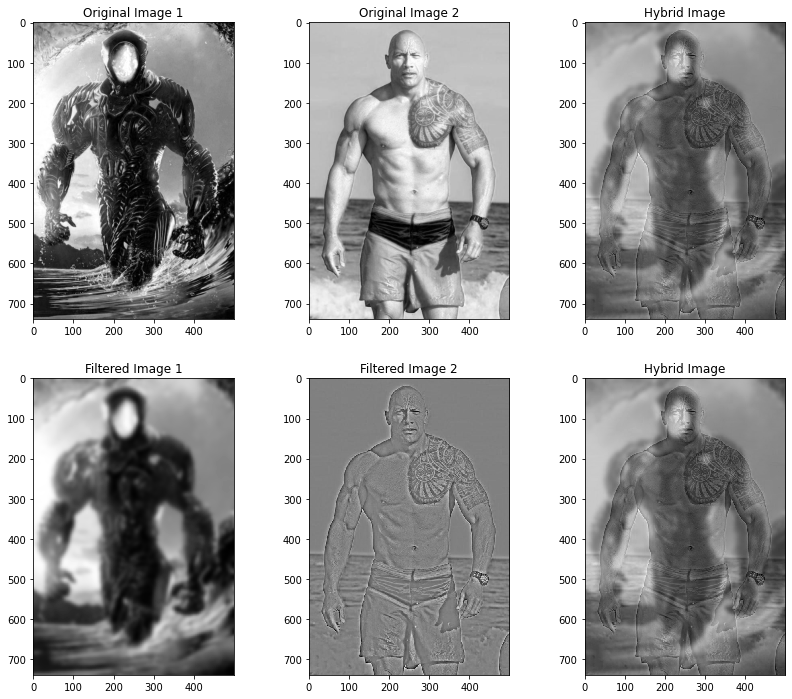

In [ ]:
image4 = "./lostinspace2.jpeg"
img4 = np.float32(cv2.imread(image4))/255
print(img4.shape)

image3 = "./body2.jpeg"
img3 = np.float32(cv2.imread(image3))/255
print(img3.shape)

h1 = hybrid_images(img4, img3, 5, 5, 3.5, 3.5, False)
# hybrid_images(img4, img3, 7, 7, 12, 9, False)

## Additional Hybrid Images
## 1. Tiger and Skull
## 2. Sunflower and Dahlia flower

(224, 190, 3)
(224, 190, 3)


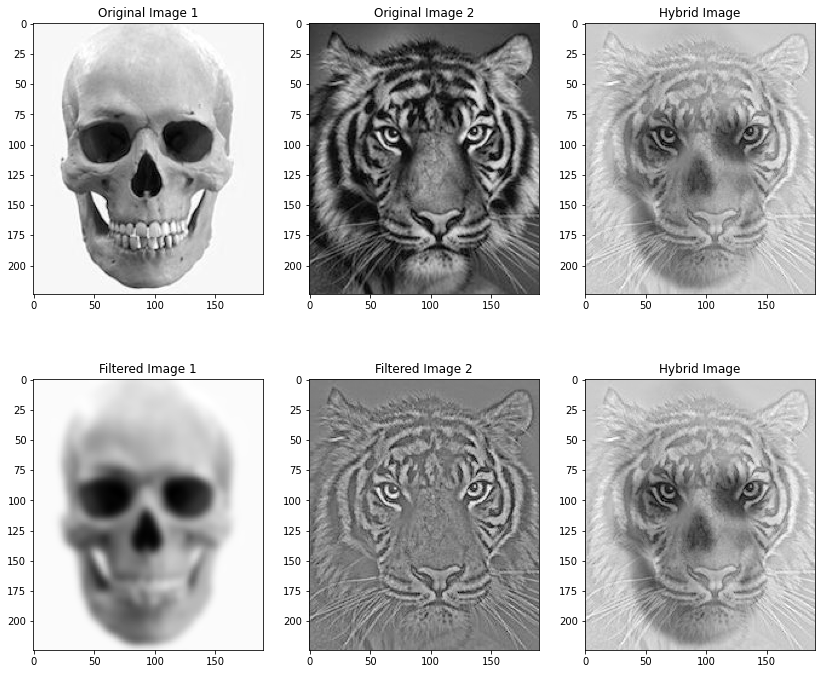

In [ ]:
image1 = "./tiger4.jpg"
img1 = np.float32(cv2.imread(image1))/255
print(img1.shape)

image2 = "./skull1.jpeg"
img2 = np.float32(cv2.imread(image2))/255
print(img2.shape)

# hybrid_images(img2, img1, 3, 3, 3.5, 3.5, False)
h2 = hybrid_images(img2, img1, 3, 3, 15, 25, False)

(448, 400, 3)
(448, 400, 3)


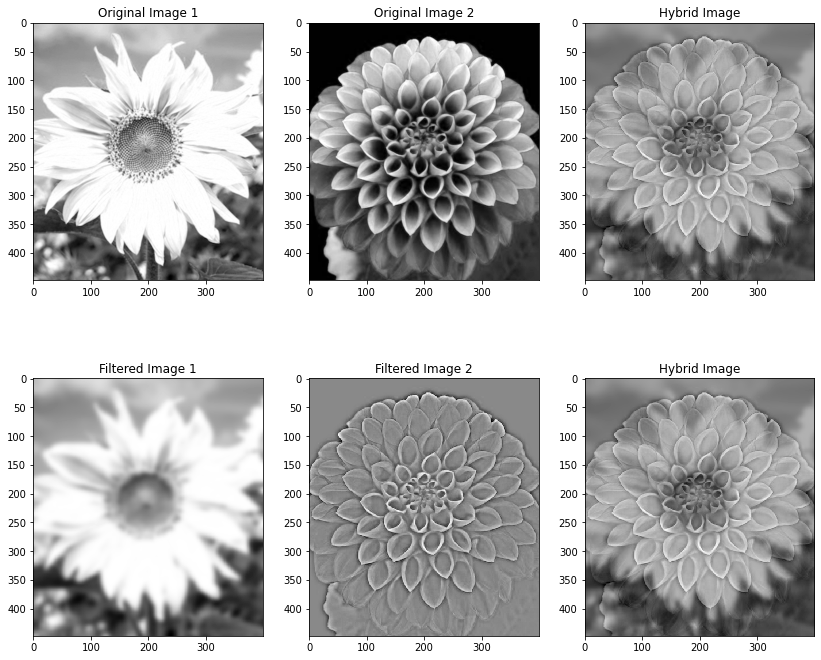

In [ ]:
image5 = "./sunflower1.jpeg"
img5 = np.float32(cv2.imread(image5))/255
print(img5.shape)

image6 = "./flower5.jpeg"
img6 = np.float32(cv2.imread(image6))/255
print(img6.shape)

h3 = hybrid_images(img5, img6, 4, 4, 5, 9, False)

# Displaying log FFT images


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in log
  """


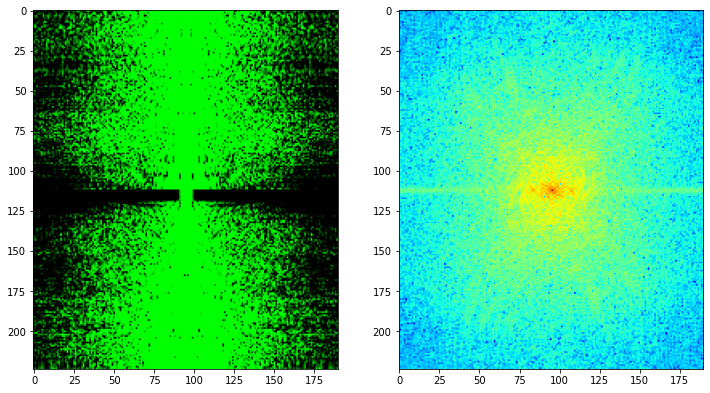

In [ ]:
# trying an example..

import matplotlib.cm as cm

mag1_img1 = np.log(np.abs(np.fft.fftshift(np.fft.fft2(img1))))
mag2_img1 = np.log(np.abs(np.fft.fftshift(np.fft.fft2(img1[:,:,0]))))
fig, ax = plt.subplots(1,2, figsize=(12, 12))
ax[0].imshow(mag1_img1, cmap='jet')
ax[1].imshow(mag2_img1, cmap='jet')
plt.show()

In [ ]:
def fourier_images(image_low, image_high, sigma_low, sigma_high, cutoff_low, cutoff_high):

  image_for_low = image_low[:,:,2]
  image_for_high = image_high[:,:,2]
  H, W = image_for_low.shape

  fftsize = 1024

  kernel_low = gaussian_filter(sigma_low, 31, 31, True)
  kernel_high = gaussian_filter(sigma_high, 31, 31, True)
  hs = kernel_low.shape[0] // 2

  low_f = np.fft.fftshift(np.fft.fft2(image_for_low,(fftsize,fftsize)))
  high_f = np.fft.fftshift(np.fft.fft2(image_for_high,(fftsize,fftsize)))

  mag_image_for_low = np.log(np.abs(low_f))
  mag_image_for_high = np.log(np.abs(high_f))

  kernel_low_fft = np.fft.fftshift(np.fft.fft2(kernel_low,(fftsize,fftsize)))
  kernel_high_fft = np.fft.fftshift(np.fft.fft2(kernel_high,(fftsize,fftsize)))

  mag_kernel_low_fft = np.abs(kernel_low_fft)
  mag_kernel_high_fft = np.abs(kernel_high_fft)

  blurred_low_fft = low_f * kernel_low_fft
  blurred_low_fft = np.fft.ifftshift(blurred_low_fft)
  blurred_low_fft = np.fft.ifft2(blurred_low_fft)
  blurred_low_fft = blurred_low_fft[hs:hs + H, hs:hs + W]
  mag_blurr = np.log(np.abs(np.fft.fftshift(np.fft.fft2(blurred_low_fft,(fftsize,fftsize)))))

  blurred_high_fft = high_f * kernel_high_fft
  sharpen_high_fft = high_f - blurred_high_fft
  sharpen_high_fft = np.fft.ifftshift(sharpen_high_fft)
  sharpen_high_fft = np.fft.ifft2(sharpen_high_fft)
  sharpen_high_fft = sharpen_high_fft[hs:hs + H, hs:hs + W]
  mag_sharp = np.log(np.abs(np.fft.fftshift(np.fft.fft2(sharpen_high_fft,(fftsize,fftsize)))))

  hybrid_fft = blurred_low_fft + sharpen_high_fft

  mag_hybrid_fft = np.log(np.abs(np.fft.fftshift(np.fft.fft2(hybrid_fft,(fftsize,fftsize)))))


  fig, axes = plt.subplots(2,3, figsize=(15, 10))
  axes[0][0].set_title('log FFT magnitude of Original Image 1')
  axes[0][1].set_title('log FFT magnitude of Original Image 2')
  axes[0][2].set_title('FFT Gaussian Filter')
  axes[1][0].set_title('log FFT magnitude of Filtered Image 1')
  axes[1][1].set_title('log FFT magnitude of Filtered Image 2')
  axes[1][2].set_title('log FFT magnitude of Hybrid Image')

  axes[0][0].imshow(mag_image_for_low,cmap='jet',interpolation='None')
  axes[0][1].imshow(mag_image_for_high,cmap='jet',interpolation='None')
  axes[0][2].imshow(mag_kernel_low_fft,cmap='jet',interpolation='None')
  axes[1][0].imshow(mag_blurr,cmap='jet',interpolation='None')
  axes[1][1].imshow(mag_sharp,cmap='jet',interpolation='None')
  axes[1][2].imshow(mag_hybrid_fft,cmap='jet',interpolation='None')

  return

# Displaying log FFT images of main hybrid image result
## Robot and Rock

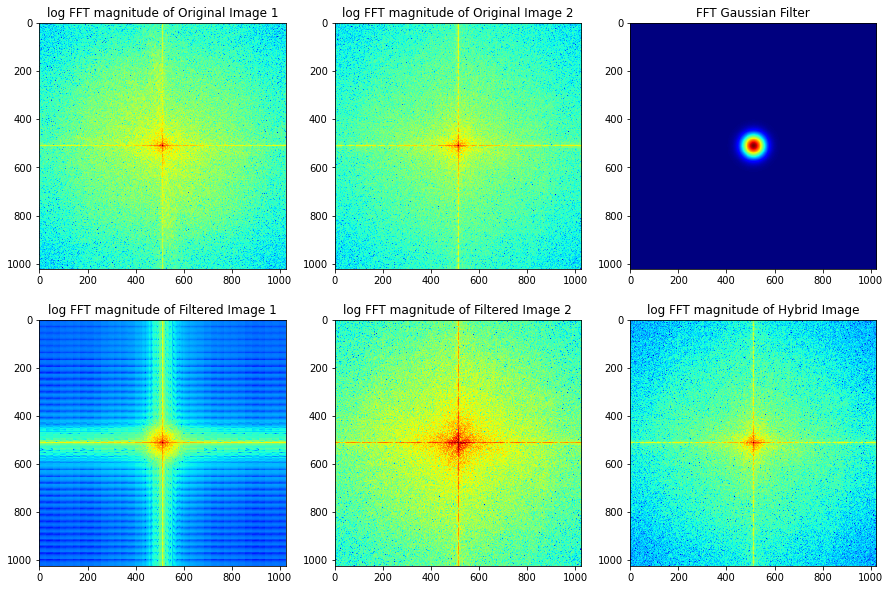

In [ ]:
# FFT of Robot and Rock

fourier_images(img4, img3, 5, 5, 3.6, 3.6)

# Displaying log FFT images of additional images
## 1. Tiger and Skull
## 2. Sunflower and Dahlia flower


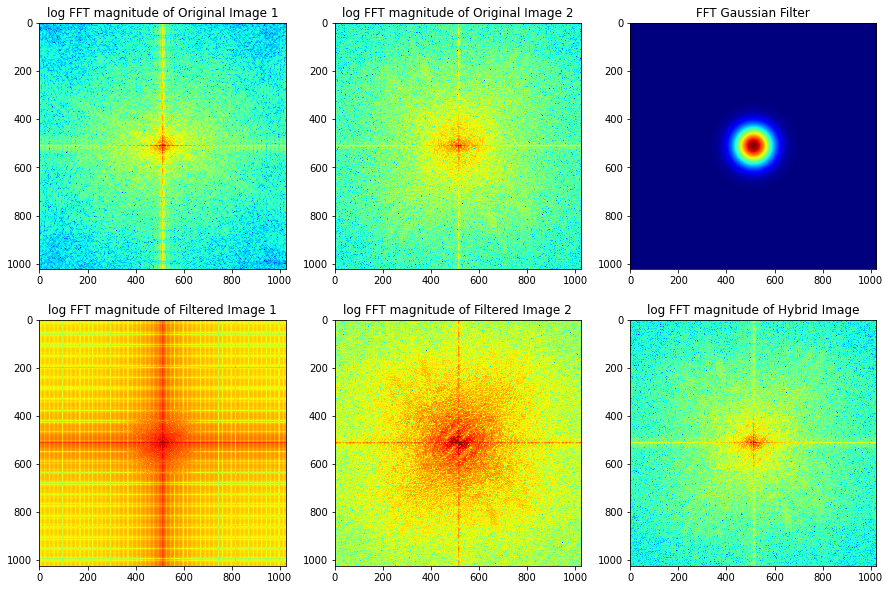

In [ ]:
# FFT of Tiger and Skull
fourier_images(img2, img1, 3, 3, 3.6, 3.6)

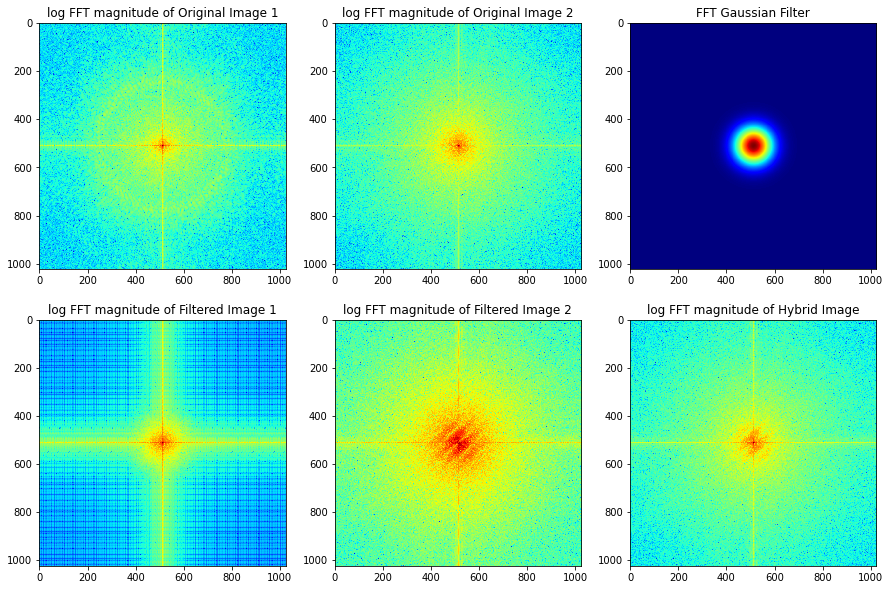

In [ ]:
# FFT of Sunflower and Dahlia flower

fourier_images(img5, img6, 3, 3, 3.6, 3.6)

# Image Enhancement

## Task 1: Contrast Enhancement

In [ ]:
import numpy as np
import cv2
import json
from matplotlib import pyplot as plt

In [ ]:
from skimage.util import img_as_ubyte

def enhance_image_using_hist_equalizer(image_file):
  image_src = cv2.imread(image_file)
  image_src_gray = cv2.cvtColor(image_src, cv2.COLOR_BGR2GRAY)
  image_src_rgb = cv2.cvtColor(image_src, cv2.COLOR_BGR2RGB)

  r_image, g_image, b_image = cv2.split(image_src_rgb)

  r_image_eq = cv2.equalizeHist(r_image)
  g_image_eq = cv2.equalizeHist(g_image)
  b_image_eq = cv2.equalizeHist(b_image)

  image_eq_rgb = cv2.merge((r_image_eq, g_image_eq, b_image_eq))

  image_eq_gray = cv2.equalizeHist(image_src_gray)

  fig, axes = plt.subplots(1,4, figsize=(12, 12))
  axes[0].set_title('Original Colour Image')
  axes[1].set_title('Enhanced Contrast Image')
  axes[2].set_title('Original Grayscale Image')
  axes[3].set_title('Enhanced Contrast Grayscale Image')

  axes[0].imshow(image_src_rgb,interpolation='None')
  axes[1].imshow(image_eq_rgb,interpolation='None')
  axes[2].imshow(image_src_gray,cmap='gray',interpolation='None')
  axes[3].imshow(image_eq_gray,cmap='gray',interpolation='None')



def enhance_image_using_gamma_correction(image_file, gamma):
  image_src = cv2.imread(image_file)
  image_src_gray = cv2.cvtColor(image_src, cv2.COLOR_BGR2GRAY)
  image_src_rgb = cv2.cvtColor(image_src, cv2.COLOR_BGR2RGB)

  invGamma = 1 / gamma

  table = [((i / 255) ** invGamma) * 255 for i in range(256)]
  table = np.array(table, np.uint8)

  enh =  cv2.LUT(image_src_rgb, table)
  enh_g = cv2.LUT(image_src_gray, table)
  fig, axes = plt.subplots(1,4, figsize=(12, 12))
  axes[0].set_title('Original Colour Image')
  axes[1].set_title('Enhanced Contrast Image')
  axes[2].set_title('Original Grayscale Image')
  axes[3].set_title('Enhanced Contrast Grayscale Image')

  axes[0].imshow(image_src_rgb,interpolation='None')
  axes[1].imshow(enh,interpolation='None')
  axes[2].imshow(image_src_gray,cmap='gray',interpolation='None')
  axes[3].imshow(enh_g,cmap='gray',interpolation='None')


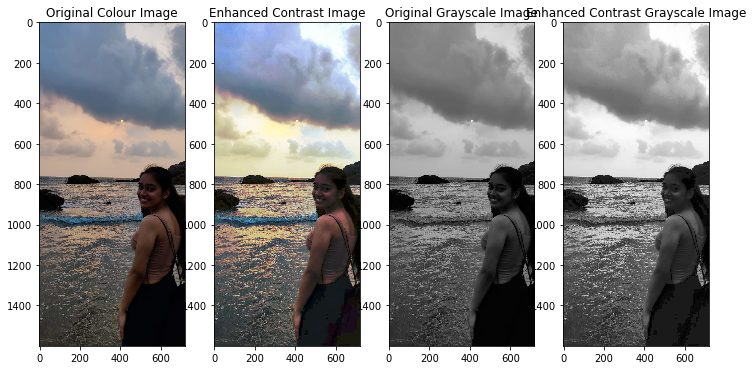

In [ ]:
enhance_image_using_hist_equalizer("./pallavi5.jpeg")


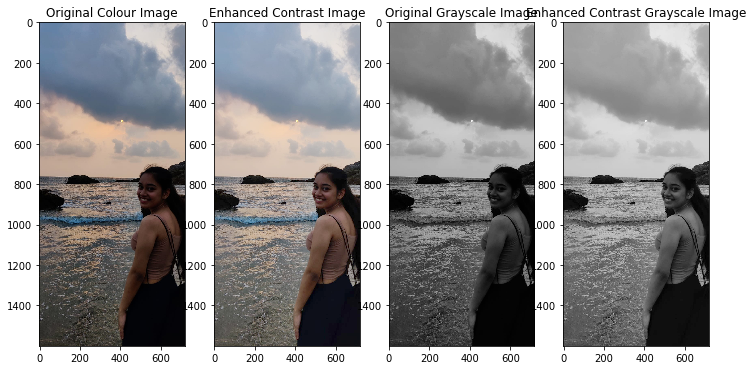

In [ ]:
enhance_image_using_gamma_correction("./pallavi5.jpeg", 1.5)

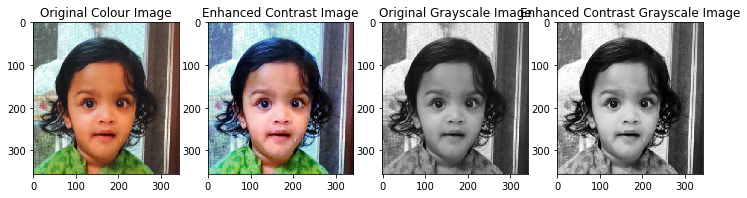

In [ ]:
enhance_image_using_hist_equalizer("./yuvaan2.jpeg")


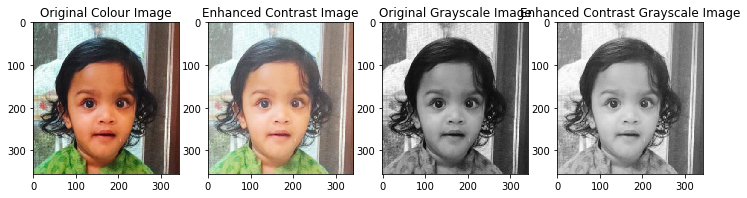

In [ ]:
enhance_image_using_gamma_correction("./yuvaan2.jpeg", 2)


## Task 2: Color Enhancement

(356, 342, 3)


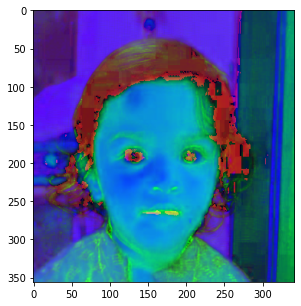

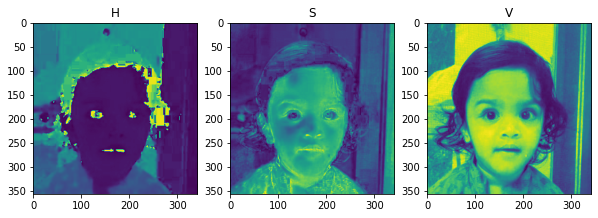

In [ ]:
# convert the image to the HSV color space and show it
image_file = cv2.imread("./yuvaan2.jpeg")
hsv = cv2.cvtColor(image_file, cv2.COLOR_BGR2HSV)
print(hsv.shape)
fig = plt.figure(figsize=(5, 5))
plt.imshow(hsv)

# loop over each of the individual channels and display them
fig, ax = plt.subplots(1,3,figsize=(10, 10))
i =0
for (name, chan) in zip(("H", "S", "V"), cv2.split(hsv)):
  ax[i].set_title(name)
  ax[i].imshow(chan)
  i+=1


In [ ]:
import statistics

# this filter applies transformation to a size * size window in the image and move to next window.
# I have taken median of all size*size values in the window and passed it through the series of conditions to decide the enhancing factor for each of those pixels.
# Ideally I could pass any channel or combination of channels of the HSV image from this filter(which I infact tried), but found manipulating Hue for my picture to work the best.

def apply_enhancing(image):

  size = 3

  for x in range(0, image.shape[0], size):
    for y in range(0, image.shape[1], size):

      exp = 1
      median_val = 0
      median_list = []
      for k in range(x,x+size):
        if(k>=image.shape[0]):
          break
        for l in range(y,y+size):
          if(l>=image.shape[1]):
            break

          median_list.append(image[k,l])

      median_val = statistics.median(median_list)
      if (median_val<=50):
        exp = 1 * 1.5

      elif (median_val > 50 and median_val <=100):
        exp = 1 * 1.3

      elif (median_val > 100 and median_val <=150):
        exp = 1 * 1.2

      # elif (median_val > 150):
      else:
        exp = 1

      for k in range(x,x+size):
        if(k>=image.shape[0]):
          break
        for l in range(y,y+size):
          if(l>=image.shape[1]):
            break

          image[k,l] = image[k,l] * exp


  return image

/usr/lib/python3.7/statistics.py:384: RuntimeWarning: overflow encountered in ubyte_scalars
  return (data[i - 1] + data[i])/2


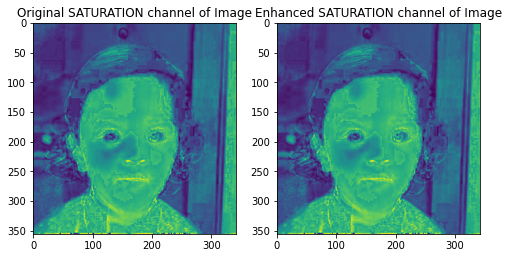

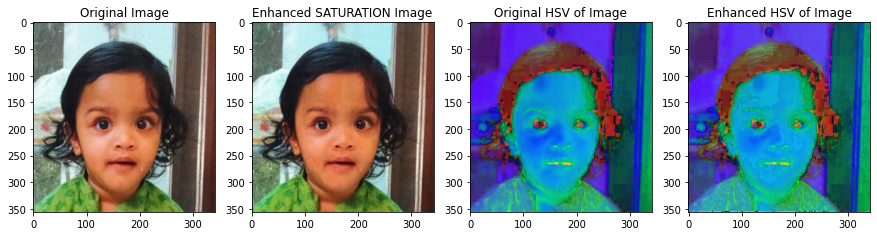

In [ ]:
# trying enhancing the SATURATION channel

channels = cv2.split(hsv)
enh_value = apply_enhancing(channels[1])

fig, ax = plt.subplots(1,2,figsize=(8, 4))
ax[0].set_title("Original SATURATION channel of Image")
ax[1].set_title("Enhanced SATURATION channel of Image")
ax[0].imshow(channels[1])
ax[1].imshow(enh_value)


out1 = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)
p = cv2.merge([channels[0], enh_value, channels[2]])
out2 = cv2.cvtColor(p, cv2.COLOR_HSV2RGB)
fig, ax = plt.subplots(1,4, figsize=(15, 15))
ax[0].set_title("Original Image")
ax[1].set_title("Enhanced SATURATION Image")
ax[2].set_title("Original HSV of Image")
ax[3].set_title("Enhanced HSV of Image")
ax[0].imshow(out1)
ax[1].imshow(out2)
ax[2].imshow(hsv)
ax[3].imshow(p)

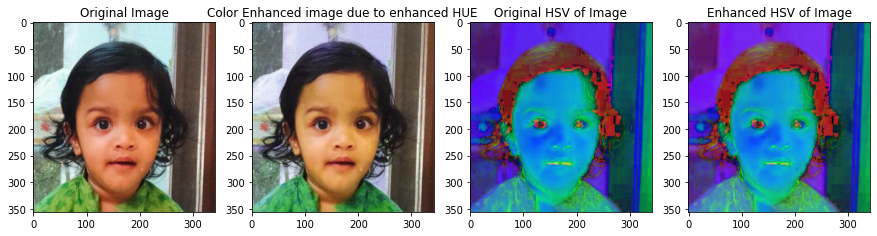

In [ ]:
# trying enhancing the HUE channel

channels = cv2.split(hsv)
enh_hue = apply_enhancing(channels[0])

out1 = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)
p = cv2.merge([enh_hue, channels[1], channels[2]])
out2 = cv2.cvtColor(p, cv2.COLOR_HSV2RGB)
fig, ax = plt.subplots(1,4, figsize=(15, 15))
ax[0].set_title("Original Image")
ax[1].set_title("Color Enhanced image due to enhanced HUE")
ax[2].set_title("Original HSV of Image")
ax[3].set_title("Enhanced HSV of Image")
ax[0].imshow(out1)
ax[1].imshow(out2)
ax[2].imshow(hsv)
ax[3].imshow(p)

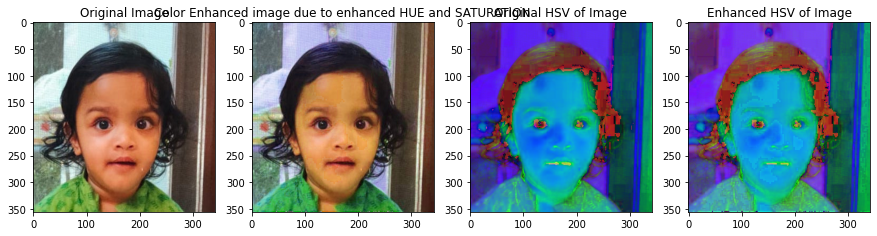

In [ ]:
# trying enhancing both the HUE and SATURATION channel

out1 = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)
p = cv2.merge([enh_hue, enh_value, channels[2]])
out2 = cv2.cvtColor(p, cv2.COLOR_HSV2RGB)
fig, ax = plt.subplots(1,4, figsize=(15, 15))
ax[0].set_title("Original Image")
ax[1].set_title("Color Enhanced image due to enhanced HUE and SATURATION")
ax[2].set_title("Original HSV of Image")
ax[3].set_title("Enhanced HSV of Image")
ax[0].imshow(out1)
ax[1].imshow(out2)
ax[2].imshow(hsv)
ax[3].imshow(p)

## Task 3: Color Shift

(384, 612, 3)


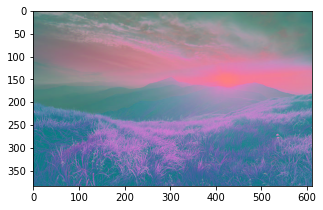

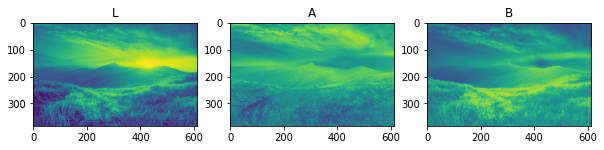

In [ ]:
# convert the image to the Lab color space and show it
image_file = cv2.imread("./landscape1.jpeg")
lab = cv2.cvtColor(image_file, cv2.COLOR_BGR2Lab)
print(lab.shape)
fig = plt.figure(figsize=(5, 5))
plt.imshow(lab)

# loop over each of the individual channels and display them
fig, ax = plt.subplots(1,3,figsize=(10, 10))
i =0
for (name, chan) in zip(("L", "A", "B"), cv2.split(lab)):
  ax[i].set_title(name)
  ax[i].imshow(chan)
  i+=1


In [ ]:
import statistics

# this function applies transformation to a size * size window in the image and move to next window.
# I have taken median of all size*size values in the window and passed it through the series of conditions to decide the enhancing factor for each of those pixels.
# I have set the exp value with which to enhance the image for each required color and channel individually with much test and experimentation.

def apply_color_shift(image, color="red", channel="a"):
  if (color == 'red'):
    if(channel=="a"):
      cmp1 = 3.6
      cmp2 = 1.5
      cmp3 = 1.2
      cmp4 = 1.1
      cmp5 = 0.8

    elif(channel=="b"):
      cmp1 = 1
      cmp2 = 1
      cmp3 = 1
      cmp4 = 0.94
      cmp5 = 0.94

  if (color == 'yellow'):
    if(channel=="a"):
      cmp1 = 1.2
      cmp2 = 1.5
      cmp3 = 1.1
      cmp4 = 1.1
      cmp5 = 1

    elif(channel=="b"):
      cmp1 = 2.9
      cmp2 = 1.5
      cmp3 = 1.5
      cmp4 = 1.4
      cmp5 = 1.8

  if (color == 'lessyellow'):
    if(channel=="a"):
      cmp1 = 1
      cmp2 = 1
      cmp3 = 1
      cmp4 = 0.9
      cmp5 = 0.9

    elif(channel=="b"):
      cmp1 = 1
      cmp2 = 1
      cmp3 = 0.9
      cmp4 = 0.8
      cmp5 = 0.75

  size = 5

  for x in range(0, image.shape[0], size):
    for y in range(0, image.shape[1], size):

      exp = 1
      median_val = 0
      median_list = []
      for k in range(x,x+size):
        if(k>=image.shape[0]):
          break
        for l in range(y,y+size):
          if(l>=image.shape[1]):
            break

          median_list.append(image[k,l])

      median_val = statistics.median(median_list)
      if (median_val<=50):
        exp = 1 * cmp1

      elif (median_val > 50 and median_val <=100):
        exp = 1 * cmp2

      elif (median_val > 100 and median_val <=150):
        exp = 1 * cmp3

      elif (median_val > 150 and median_val <=200):
        exp = 1 * cmp4

      else:
        exp = 1 * cmp5

      for k in range(x,x+size):
        if(k>=image.shape[0]):
          break
        for l in range(y,y+size):
          if(l>=image.shape[1]):
            break

          image[k,l] = image[k,l] * exp


  return image

## Obtaining a Red version of the image

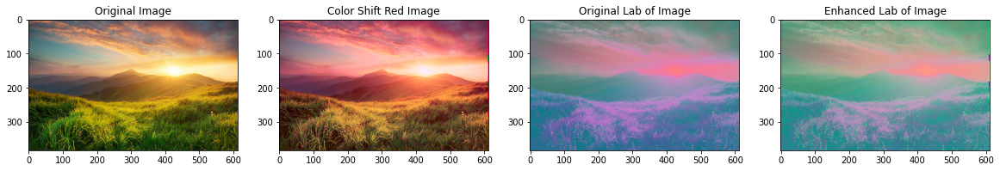

In [ ]:
# trying enhancing the a channel (green to magenta)

channels = cv2.split(lab)
enh_red_a = apply_color_shift(channels[1], color="red", channel="a")
enh_red_b = apply_color_shift(channels[2], color="red", channel="b")

out1 = cv2.cvtColor(lab, cv2.COLOR_Lab2RGB)
p = cv2.merge([channels[0], enh_red_a, enh_red_b])
out2 = cv2.cvtColor(p, cv2.COLOR_Lab2RGB)
fig, ax = plt.subplots(1,4, figsize=(20, 20))
ax[0].set_title("Original Image")
ax[1].set_title("Color Shift Red Image")
ax[2].set_title("Original Lab of Image")
ax[3].set_title("Enhanced Lab of Image")
ax[0].imshow(out1)
ax[1].imshow(out2)
ax[2].imshow(lab)
ax[3].imshow(p)

## Obtaining a Less Yellow version of the image

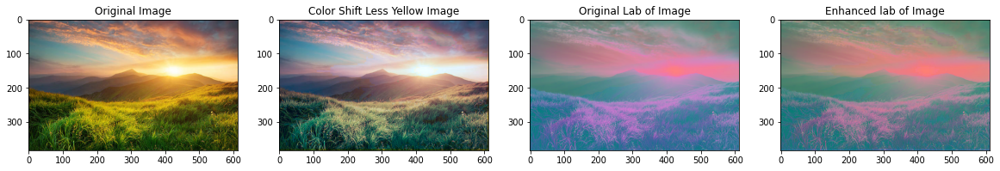

In [ ]:
# trying enhancing the b channel (blue to yellow)

channels = cv2.split(lab)
enh_yellow_a = apply_color_shift(channels[1], color="lessyellow", channel="a")
enh_yellow_b = apply_color_shift(channels[2], color="lessyellow", channel="b")

out1 = cv2.cvtColor(lab, cv2.COLOR_Lab2RGB)
p = cv2.merge([channels[0], enh_yellow_a, enh_yellow_b])
out2 = cv2.cvtColor(p, cv2.COLOR_Lab2RGB)
fig, ax = plt.subplots(1,4, figsize=(20, 20))
ax[0].set_title("Original Image")
ax[1].set_title("Color Shift Less Yellow Image")
ax[2].set_title("Original Lab of Image")
ax[3].set_title("Enhanced lab of Image")
ax[0].imshow(out1)
ax[1].imshow(out2)
ax[2].imshow(lab)
ax[3].imshow(p)

## Plotting Original, Red and Yellow in a row

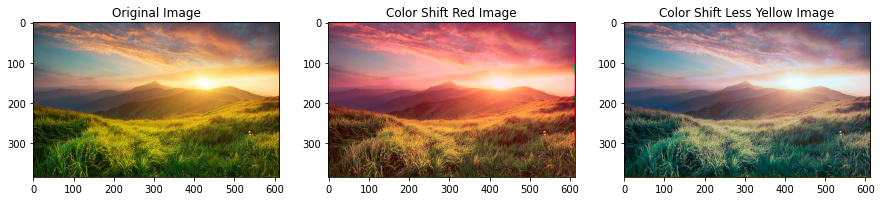

In [ ]:
ori = cv2.cvtColor(lab, cv2.COLOR_Lab2RGB)

p_red = cv2.merge([channels[0], enh_red_a, enh_red_b])
p_yellow = cv2.merge([channels[0], enh_yellow_a, enh_yellow_b])

out1 = cv2.cvtColor(p_red, cv2.COLOR_Lab2RGB)
out2 = cv2.cvtColor(p_yellow, cv2.COLOR_Lab2RGB)


fig, ax = plt.subplots(1,3, figsize=(15, 15))
ax[0].set_title("Original Image")
ax[1].set_title("Color Shift Red Image")
ax[2].set_title("Color Shift Less Yellow Image")
ax[0].imshow(ori)
ax[1].imshow(out1)
ax[2].imshow(out2)


# Advanced Processing

## Advanced Processing #1 Applying Colour to the main hybrid image

(739, 500, 3)
(739, 500, 3)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: Images with dimensions (M, N, 3) are interpreted as 2D+RGB by default. Use `multichannel=False` to interpret as 3D image with last dimension of length 3.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: RuntimeWarning: Images with dimensions (M, N, 3) are interpreted as 2D+RGB by default. Use `multichannel=False` to interpret as 3D image with last dimension of length 3.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:40: RuntimeWarning: Images with dimensions (M, N, 3) are interpreted as 2D+RGB by default. Use `multichannel=False` to interpret as 3D image with last dimension of length 3.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:41: RuntimeWarning: Images with dimensions (M, N, 3) are interpreted as 2D+RGB by default. Use `multichannel=False` to interpret as 3D image with last dimension of length 3.


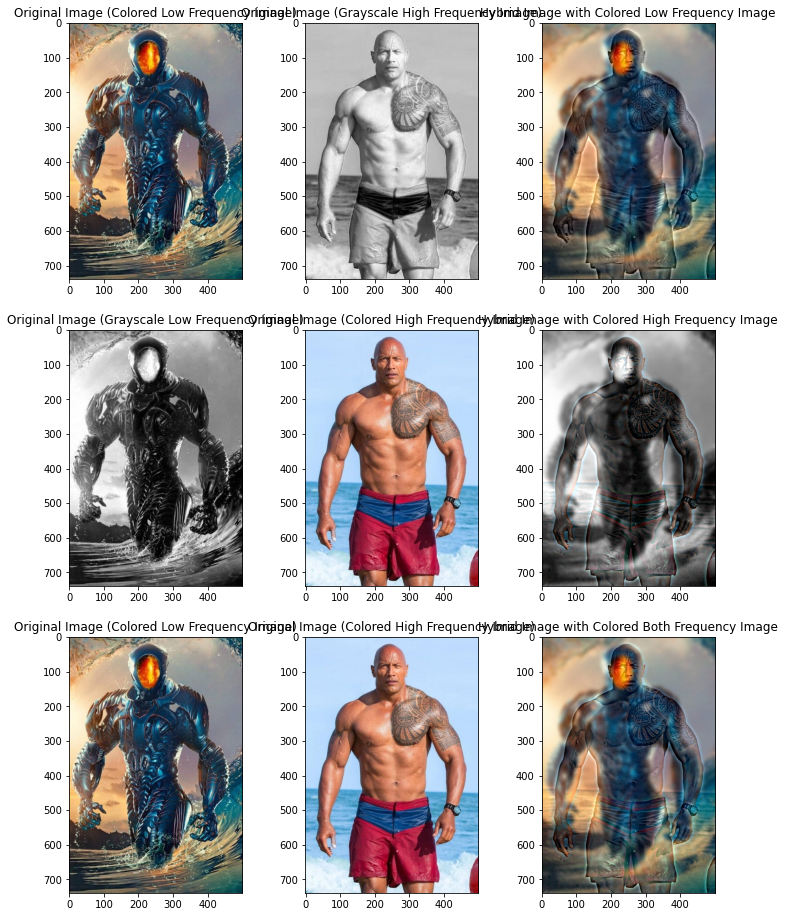

In [ ]:
image4 = "./lostinspace2.jpeg"
img4 = np.float32(cv2.imread(image4, cv2.COLOR_BGR2RGB))/255
print(img4.shape)

image3 = "./body2.jpeg"
img3 = np.float32(cv2.imread(image3, cv2.COLOR_BGR2RGB))/255
print(img3.shape)


image_low = img4
image_high = img3
sigma_low = 5
sigma_high = 5
cutoff_low = 3.6
cutoff_high = 3.6

image_for_low = image_low
image_for_high = image_high[:,:,0]
blurred_low = filters.gaussian(image_for_low, sigma=(sigma_low, sigma_low), truncate=cutoff_low)
blurred_high = filters.gaussian(image_for_high, sigma=(sigma_high, sigma_high), truncate=cutoff_high)
sharpen_high = image_for_high - blurred_high
sharpen_high = cv2.merge((sharpen_high, sharpen_high, sharpen_high))
hybrid = blurred_low + sharpen_high
hybrid_low_col = cv2.cvtColor(hybrid, cv2.COLOR_RGB2BGR)



image_for_high = image_high
image_for_low = image_low[:,:,2]
blurred_low = filters.gaussian(image_for_low, sigma=(sigma_low, sigma_low), truncate=cutoff_low)
blurred_low = cv2.merge((blurred_low, blurred_low, blurred_low))
blurred_high = filters.gaussian(image_for_high, sigma=(sigma_high, sigma_high), truncate=cutoff_high)
sharpen_high = image_for_high - blurred_high
hybrid = blurred_low + sharpen_high
hybrid_high_col = cv2.cvtColor(hybrid, cv2.COLOR_RGB2BGR)


image_for_low = image_low
image_for_high = image_high
blurred_low = filters.gaussian(image_for_low, sigma=(sigma_low, sigma_low), truncate=cutoff_low)
blurred_high = filters.gaussian(image_for_high, sigma=(sigma_high, sigma_high), truncate=cutoff_high)
sharpen_high = image_for_high - blurred_high
hybrid = blurred_low + sharpen_high
hybrid_both_col = cv2.cvtColor(hybrid, cv2.COLOR_RGB2BGR)


fig, axes = plt.subplots(3,3, figsize=(12, 16))
axes[0][0].set_title('Original Image (Colored Low Frequency Image)')
axes[0][1].set_title('Original Image (Grayscale High Frequency Image)')
axes[0][2].set_title('Hybrid Image with Colored Low Frequency Image')

axes[1][0].set_title('Original Image (Grayscale Low Frequency Image)')
axes[1][1].set_title('Original Image (Colored High Frequency Image)')
axes[1][2].set_title('Hybrid Image with Colored High Frequency Image')

axes[2][0].set_title('Original Image (Colored Low Frequency Image)')
axes[2][1].set_title('Original Image (Colored High Frequency Image)')
axes[2][2].set_title('Hybrid Image with Colored Both Frequency Image')

axes[0][0].imshow(cv2.cvtColor(image_low, cv2.COLOR_RGB2BGR))
axes[0][1].imshow(cv2.cvtColor(cv2.merge((image_high[:,:,2],image_high[:,:,2],image_high[:,:,2])), cv2.COLOR_RGB2BGR))
axes[0][2].imshow(hybrid_low_col)
axes[1][0].imshow(cv2.cvtColor(cv2.merge((image_low[:,:,2],image_low[:,:,2],image_low[:,:,2])), cv2.COLOR_RGB2BGR))
axes[1][1].imshow(cv2.cvtColor(image_high, cv2.COLOR_RGB2BGR))
axes[1][2].imshow(hybrid_high_col)
axes[2][0].imshow(cv2.cvtColor(image_low, cv2.COLOR_RGB2BGR))
axes[2][1].imshow(cv2.cvtColor(image_high, cv2.COLOR_RGB2BGR))
axes[2][2].imshow(hybrid_both_col)

## Advanced Processing #2 Creating Gaussian and Laplacian Pyramids of the Main Hybrid Image

(739, 500, 3)
(739, 500, 3)


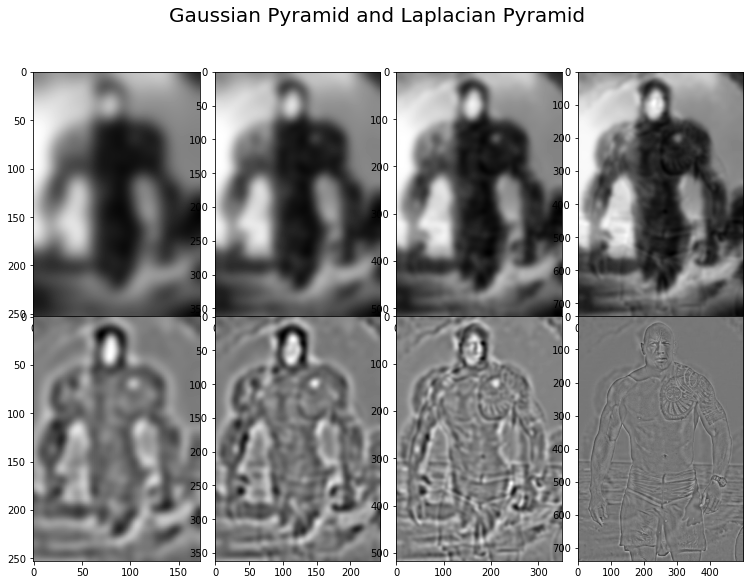

In [ ]:
image4 = "./lostinspace2.jpeg"
img4 = np.float32(cv2.imread(image4, cv2.COLOR_BGR2RGB))/255
print(img4.shape)

image3 = "./body2.jpeg"
img3 = np.float32(cv2.imread(image3, cv2.COLOR_BGR2RGB))/255
print(img3.shape)

hybrid = hybrid_images(img4, img3, 5, 5, 3.5, 3.5, False, plot = False)

res1 = filters.gaussian(hybrid, sigma=5, truncate=4)
lap1 = hybrid-res1

sub1 = cv2.resize(res1, None, fx=0.7, fy=0.7, interpolation = cv2.INTER_CUBIC)
res2 = filters.gaussian(sub1, sigma=5, truncate=4)
lap2 = sub1-res2

sub2 = cv2.resize(res2, None, fx=0.7, fy=0.7, interpolation = cv2.INTER_CUBIC)
res3 = filters.gaussian(sub2, sigma=5, truncate=4)
lap3 = sub2-res3

sub3 = cv2.resize(res3, None, fx=0.7, fy=0.7, interpolation = cv2.INTER_CUBIC)
res4 = filters.gaussian(sub3, sigma=5, truncate=4)

lap4 = sub3-res4

# sub4 = cv2.resize(res4, None, fx=0.5, fy=0.5, interpolation = cv2.INTER_CUBIC)
# res5 = filters.gaussian(sub4, sigma=5, truncate=4)

fig, axes = plt.subplots(2,4, figsize=(13, 9))
fig.suptitle("Gaussian Pyramid and Laplacian Pyramid", fontsize=20)
plt.subplots_adjust(wspace=0, hspace=0)

axes[0][0].imshow(res4, cmap="gray")
axes[0][1].imshow(res3, cmap="gray")
axes[0][2].imshow(res2, cmap="gray")
axes[0][3].imshow(res1, cmap="gray")

axes[1][0].imshow(lap4, cmap="gray")
axes[1][1].imshow(lap3, cmap="gray")
axes[1][2].imshow(lap2, cmap="gray")
axes[1][3].imshow(lap1, cmap="gray")


